In [1]:
import numpy as np
import pandas as pd
from typing import NamedTuple, Iterable, List, Mapping, Dict, Optional, Set
import random
import matplotlib.pyplot as plt
import plotly.express as px

In [45]:
data = pd.read_csv("data.csv") # Data without geocell col

In [3]:
class Point(NamedTuple):
    idx: int
    lat: float
    lng: float

In [4]:
class Cell:
    def __init__(self, points: Set[Point]):
        self.points = points
        if len(self.points) == 0:
            return
        self.min_lat = min(points, key=lambda p: p.lat).lat
        self.max_lat = max(points, key=lambda p: p.lat).lat
        self.min_lng = min(points, key=lambda p: p.lng).lng
        self.max_lng = max(points, key=lambda p: p.lng).lng
        
        self.med_lat_lng = self._med_lat_lng()
    
    def _med_lat_lng(self):
        mid = len(self) // 2
        lat = sorted(self.points, key=lambda p: p.lat)[mid].lat
        lng = sorted(self.points, key=lambda p: p.lng)[mid].lng
        return lat, lng
    
    def split(self):
        split_on_lat = self._should_split_on_lat()
        frac = 0.5 + np.random.normal(scale=0.05) # slightly random split
        p1, p2 = set(), set()
        if split_on_lat:
            thresh = (self.max_lat + self.min_lat) / 2
            for p in self.points:
                if p.lat < thresh: p1.add(p)
                else: p2.add(p)
        else:
            thresh = (self.max_lng + self.min_lng) / 2
            for p in self.points:
                if p.lng < thresh: p1.add(p)
                else: p2.add(p)
        return [Cell(p1), Cell(p2)]
    
    def _should_split_on_lat(self):
        # True = split lat, False = split_lng
        lat_range = self.max_lat - self.min_lat
        lng_range = self.max_lng - self.min_lng
        if lat_range > lng_range:
            return True
        if lng_range > lat_range:
            return False
        return random.choice([True, False])

    def __len__(self):
        return len(self.points)
    
    def __str__(self):
        if len(self) == 0:
            return "Empty!"
        return (
            f"Length: {len(self)}"
            f"\nLat range: {self.min_lat:.3f} to {self.max_lat:.3f}"
            f"\nLng range: {self.min_lng:.3f} to {self.max_lng:.3f}"
            f"\nMedian point: {self.med_lat_lng}"
        )

In [5]:
points = [
    Point(i, lat, lng) 
    for i, (lat, lng) in enumerate(zip(data.lat, data.lng))
]

In [12]:
MAX_CELL_SIZE = 600

def get_cells():
    random.seed(3)
    np.random.seed(3)
    final_cells = []
    large_cells = [Cell(points)]
    while len(large_cells) > 0:
        new_large_cells = []
        for cell in large_cells:
            if len(cell) < MAX_CELL_SIZE:
                if len(cell) > 0: final_cells.append(cell)
                continue
            new_large_cells += cell.split()
        large_cells = new_large_cells
        
     # Remove small cells
#     final_cells = [c for c in final_cells if len(c) >= 50]
    
    return final_cells

In [13]:
cells = get_cells()
len(cells)

289

In [14]:
median_lats, median_lngs = zip(*[c.med_lat_lng for c in cells])
cell_centers = pd.DataFrame({'lat': median_lats, 'lng': median_lngs})
cell_centers.to_csv("geocell_centers.csv")

In [15]:
lens = np.array(list(map(len, cells)))
lens.mean()

339.7750865051903

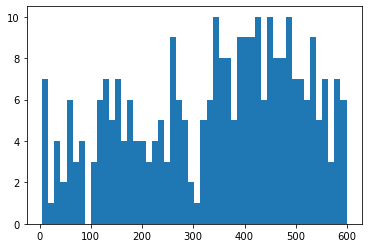

In [16]:
plt.hist(lens, bins=50)
plt.show()

In [21]:
def get_data_with_cats(data):
    cats = [-1] * len(data)
    for i, cell in enumerate(cells):
        for p in cell.points:
            cats[p.idx] = i
    data_cats = data.copy()
    data_cats['geocell'] = cats
    points_to_keep = [i for i, c in enumerate(cats) if c != -1]
    data_cats = data_cats.iloc[points_to_keep]
    return data_cats

In [25]:
data_cats = get_data_with_cats(data)
data_cats.to_csv("data.csv")
data_cats = pd.read_csv("data.csv", index_col=0)
data_cats

,id,lat,lng,country,country_idx,geocell,geocell_idx,population,set,country_name
0,ltbLypZTB0b54YldBhcrYQ,61.772846,-149.934780,us,83,10,7,0.101961,test,United States
1,4YLg9of3KX6wKna1hD-Bqw,42.829094,-71.781700,us,83,188,176,0.231373,train,United States
2,VmQWOJCj9lgSQnAbCgH_bA,36.138850,-95.990140,us,83,132,123,0.529412,train,United States
3,FEUW8CKZo3HdyW-O4SJSow,35.028843,-89.817060,us,83,133,124,0.603922,test,United States
4,jW-3dsHVWPvaxA7g-VNW5Q,27.803684,-82.696300,us,83,175,163,0.596078,train,United States
...,...,...,...,...,...,...,...,...,...,...
97843,E7HXy8jZ0Wys10tqsQKrNA,41.429955,22.645054,mk,54,148,139,0.600000,train,"Macedonia, the Former Yugoslav Republic of"
97844,GMj2z-qlBglRwihw9NOmCg,42.120470,21.719280,mk,54,148,139,0.537255,train,"Macedonia, the Former Yugoslav Republic of"
97845,dMJByJ1NS3PcFA--Szfozw,42.002600,21.446304,mk,54,148,139,0.792157,test,"Macedonia, the Former Yugoslav Republic of"
97846,tMGkM66AS9_8CS3yisOtMQ,41.496384,20.946745,mk,54,148,139,0.498039,train,"Macedonia, the Former Yugoslav Republic of"


In [23]:
## VISUALIZE ##

In [19]:
def show_cats(data):
    data = data.copy()
    cats = data.geocell.unique()
    random.shuffle(cats)
    cat2idx = {c: i for i, c in enumerate(cats)}
    data.geocell = [cat2idx[c] for c in data.geocell]
    fig = px.scatter_mapbox(
        data,
        lat="lat",
        lon="lng",
        color="geocell",
        color_continuous_scale=px.colors.qualitative.Alphabet,
    )
    fig.update_layout(
        mapbox_style="open-street-map",
        coloraxis_showscale=False,
        margin=dict(t=0, b=0, l=0, r=0),
    )
    fig.show()
    plt.pause(0.001)

In [20]:
def show_country(country):
    show_cats(data_cats[data_cats.country == country])

In [21]:
def show_us():
    random.seed(6)
    show_country('us')
    
show_us()

In [22]:
def show_fr():
    random.seed(0)
    show_country("fr")

show_fr()

In [23]:
def show_great_britain():
    random.seed(1)
    show_country('gb')

show_great_britain()

In [24]:
def show_world():
    random.seed(0)
    show_cats(data_cats)

show_world()